In [ ]:
suppressMessages(library(ggplot2))
suppressMessages(library(ArchR))
suppressMessages(library(Seurat))
suppressMessages(library(Signac))
suppressMessages(library(purrr))
suppressMessages(library(readr))
suppressMessages(library(patchwork))
suppressMessages(library(BSgenome.Hsapiens.UCSC.hg38))
suppressMessages(library(dplyr))
suppressMessages(library(cowplot))
suppressMessages(library(ggrepel))
suppressMessages(library(rhdf5))
suppressMessages(library(chromVARmotifs))
suppressMessages(library(pheatmap))

In [2]:
set.seed(42)
addArchRThreads(threads = 64)

Setting default number of Parallel threads to 64.



In [3]:
proj <- loadArchRProject("./ArchRProject_CD8", showLogo = FALSE)

Successfully loaded ArchRProject!



In [4]:
proj <- addImputeWeights(proj)

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-29a4d1564a6e29-Date-2025-04-19_Time-09-30-33.621194.log
If there is an issue, please report to github with logFile!

2025-04-19 09:30:34.018013 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.

Filtering 1 dims correlated > 0.75 to log10(depth + 1)



In [6]:
proj <- addHarmony(
    ArchRProj = proj,
    reducedDims = "IterativeLSI",
    name = "Harmony_CD8",
    groupBy = "Sample",
    force = TRUE
)

Filtering 1 dims correlated > 0.75 to log10(depth + 1)

Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations



In [7]:
proj <- addUMAP(
    ArchRProj = proj,
    reducedDims = "Harmony_CD8",
    name = "UMAP_CD8",
    nNeighbors = 45,   # 默认是 15，可以尝试 30 或更大
    minDist = 0.05,     # 默认是 0.1，可以尝试 0.05 或更小
    metric = "cosine",  # 可以尝试不同的距离度量，如 "euclidean", "manhattan"
    force = TRUE
)

09:37:07 UMAP embedding parameters a = 1.75 b = 0.8421

09:37:07 Read 10476 rows and found 29 numeric columns

09:37:07 Using Annoy for neighbor search, n_neighbors = 45

09:37:07 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*


*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

09:37:08 Writing NN index file to temp file /tmp/RtmpA8Rjbn/file87194645f2a98

09:37:08 Searching Annoy index using 48 threads, search_k = 4500

09:37:08 Annoy recall = 100%

09:37:09 Commencing smooth kNN distance calibration using 48 threads
 with target n_neighbors = 45

09:37:10 Initializing from normalized Laplacian + noise (using RSpectra)

09:37:10 Commencing optimization for 200 epochs, with 710030 positive edges

09:37:10 Using rng type: pcg

09:37:19 Optimization finished

09:37:19 Creating temp model dir /tmp/RtmpA8Rjbn/dir87194788c8b15

09:37:19 Creating dir /tmp/RtmpA8Rjbn/dir87194788c8b15

09:37:20 Changing to /tmp/RtmpA8Rjbn/dir87194788c8b15

09:37:20 Creating /home/hanxue/lab/scATAC/BCY_ATAC_R/joint/ArchRProject_CD8/Embeddings/Save-Uwot-UMAP-Params-Harmony_CD8-871942ffbd600-Date-2025-03-21_Time-09-37-19.06625.tar



ArchR logging to : ArchRLogs/ArchR-plotEmbedding-871947ed8f8b-Date-2025-03-25_Time-07-00-08.8986.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-871947ed8f8b-Date-2025-03-25_Time-07-00-08.8986.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8719419258d8a-Date-2025-03-25_Time-07-00-09.338677.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8719419258d8a-Date-2025-03-25_Time-07-00-09.338677.log



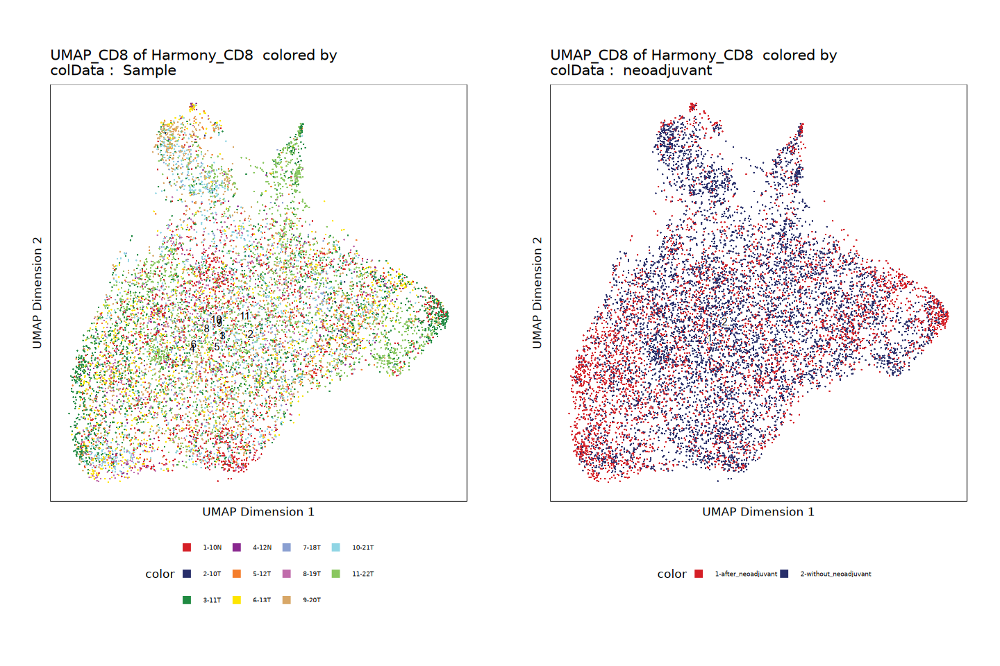

In [45]:
options(repr.plot.height = 8, repr.plot.width = 12)
p1 <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "cellColData", 
    name = "Sample", 
    embedding = "UMAP_CD8"
    )
p2 <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "cellColData", 
    name = "neoadjuvant", 
    embedding = "UMAP_CD8"
    )
ggAlignPlots(p1, p2, type = "h")

In [10]:
proj <- addClusters(proj, name = "clusters_CD8", resolution = 1.5, force = TRUE)

ArchR logging to : ArchRLogs/ArchR-addClusters-871943ee9c2b6-Date-2025-03-21_Time-09-37-26.231342.log
If there is an issue, please report to github with logFile!

Filtering 1 dims correlated > 0.75 to log10(depth + 1)

2025-03-21 09:37:26.524952 : Running Seurats FindClusters (Stuart et al. Cell 2019), 0.004 mins elapsed.

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 10476
Number of edges: 353422

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7513
Number of communities: 17
Elapsed time: 1 seconds


2025-03-21 09:37:38.527896 : Testing Outlier Clusters, 0.204 mins elapsed.

2025-03-21 09:37:38.532946 : Assigning Cluster Names to 17 Clusters, 0.204 mins elapsed.

2025-03-21 09:37:38.628205 : Finished addClusters, 0.206 mins elapsed.



In [11]:
table(proj$clusters_CD8)


  C1  C10  C11  C12  C13  C14  C15  C16  C17   C2   C3   C4   C5   C6   C7   C8 
 356  974  199  359  768  633  358  759  307  509 1139  981  329  758  678  740 
  C9 
 629 

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8719449ef27bf-Date-2025-03-21_Time-09-37-38.667221.log
If there is an issue, please report to github with logFile!



Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8719449ef27bf-Date-2025-03-21_Time-09-37-38.667221.log



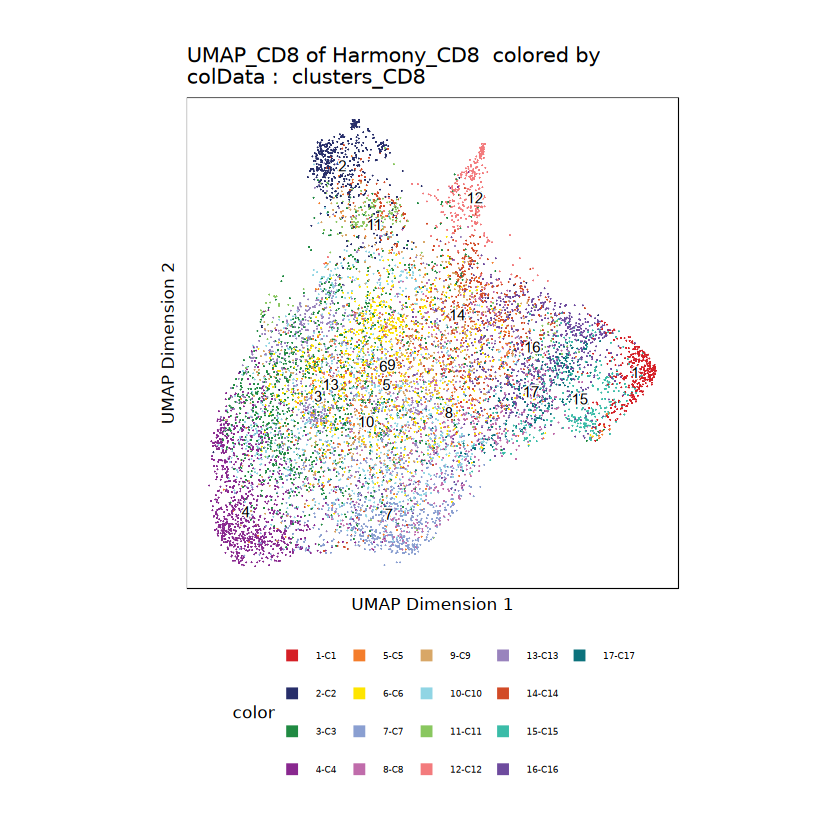

In [12]:
p1 <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "cellColData", 
    name = "clusters_CD8", 
    embedding = "UMAP_CD8"
    )
p1

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8719422451215-Date-2025-03-21_Time-09-37-41.079948.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-21 09:37:41.320434 : 



Plotting Embedding

1 
2 
3 
4 
5 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8719422451215-Date-2025-03-21_Time-09-37-41.079948.log

Warning message:
“The `<scale>` argument of `guides()` cannot be `FALSE`. Use "none" instead as
of ggplot2 3.3.4.”


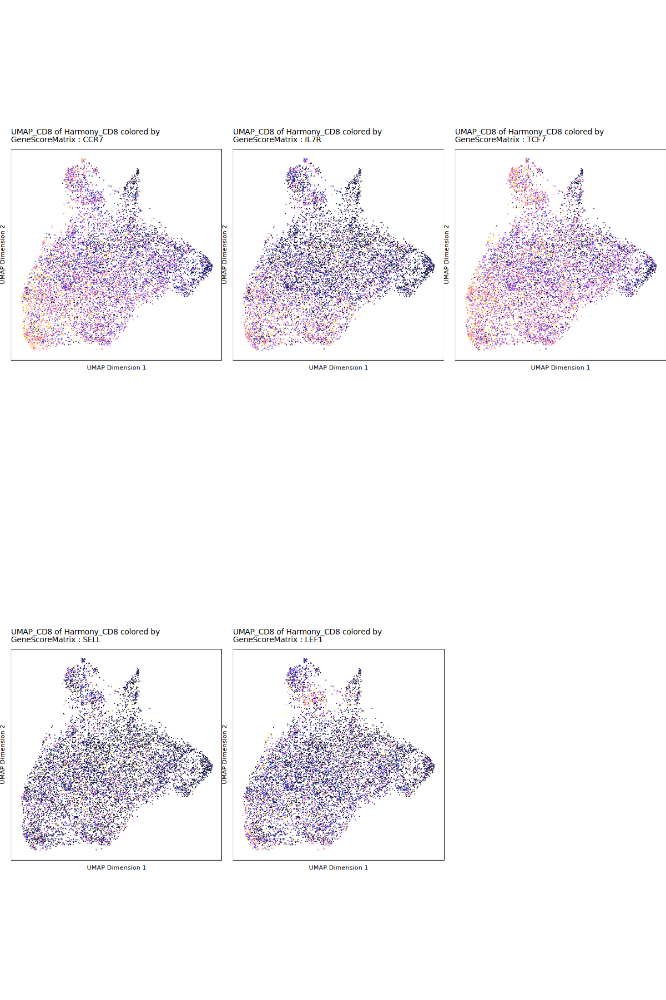

In [13]:
# Tn
markerGenes <- c(
  "CCR7", "IL7R", "TCF7", "SELL", "LEF1"
)

# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD8",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8719464465253-Date-2025-03-21_Time-09-37-53.867043.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-21 09:37:54.165145 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 
5 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8719464465253-Date-2025-03-21_Time-09-37-53.867043.log



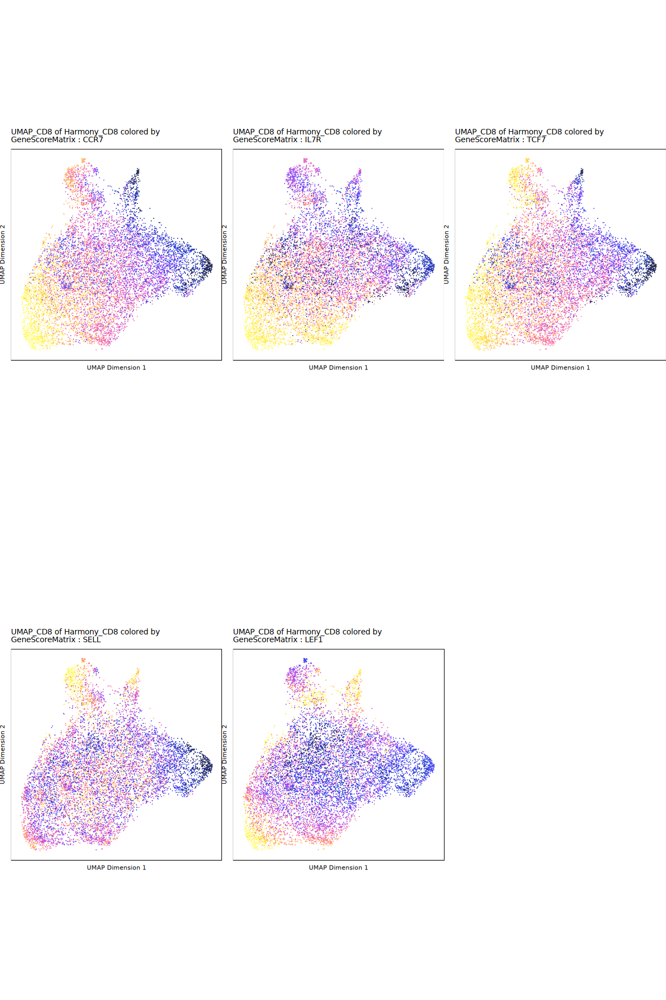

In [14]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD8",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-87194115da5e-Date-2025-03-21_Time-09-38-15.546244.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-21 09:38:15.808658 : 



Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-87194115da5e-Date-2025-03-21_Time-09-38-15.546244.log



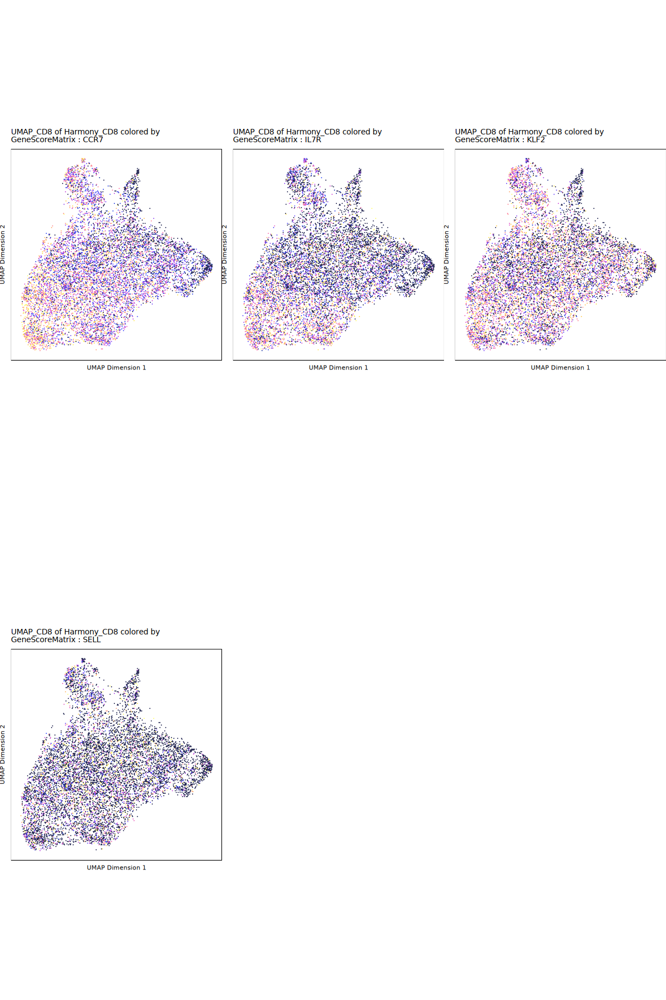

In [15]:
# Tcm
markerGenes <- c(
  "CCR7", "IL7R", "KLF2", "SELL"
)

# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD8",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8719428a2c123-Date-2025-03-21_Time-09-38-27.534194.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-21 09:38:27.786896 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8719428a2c123-Date-2025-03-21_Time-09-38-27.534194.log



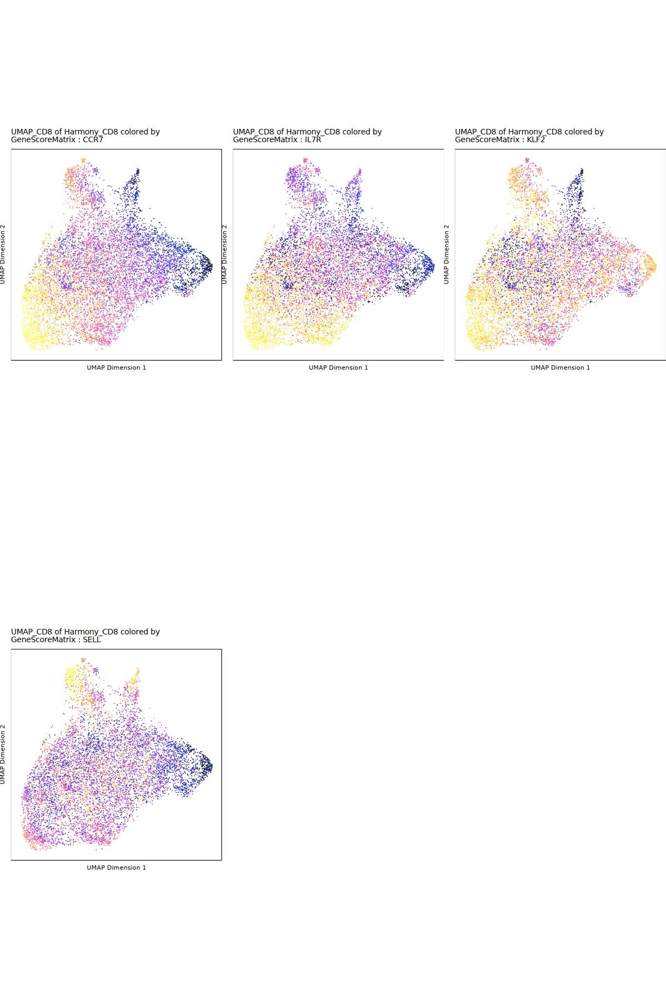

In [16]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD8",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-87194289a427a-Date-2025-03-21_Time-09-38-47.947709.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-21 09:38:48.20287 : 



Plotting Embedding

1 
2 
3 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-87194289a427a-Date-2025-03-21_Time-09-38-47.947709.log



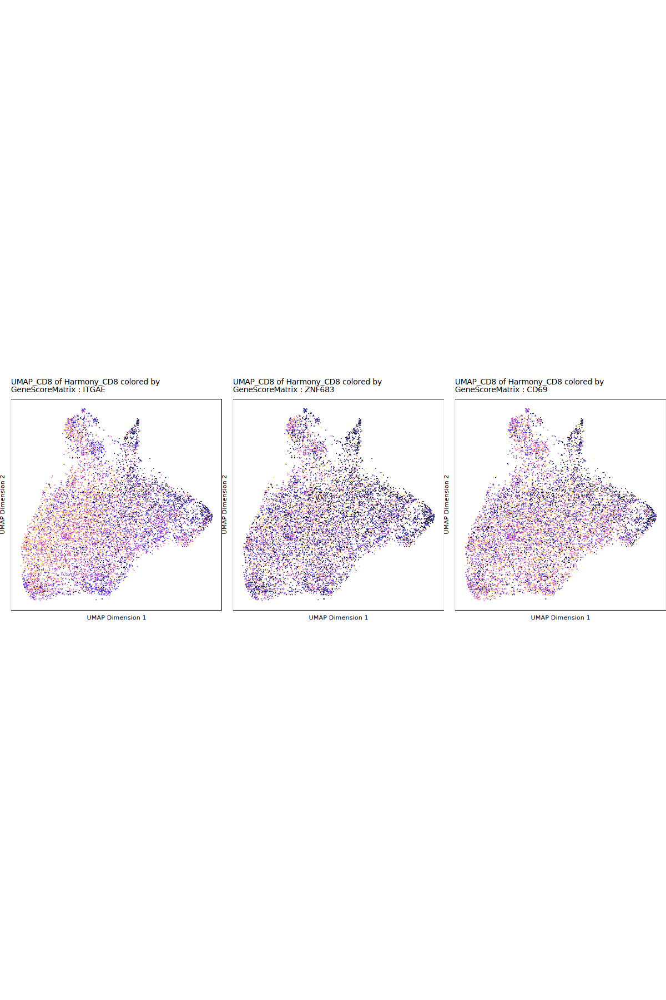

In [ ]:
# Trm
markerGenes <- c(
  "ITGAE", "ZNF683", "CD69"
)

# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD8",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)suppressMessages(library(Heatmap))
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8719439700595-Date-2025-03-21_Time-09-38-58.420851.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-21 09:38:58.670893 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8719439700595-Date-2025-03-21_Time-09-38-58.420851.log



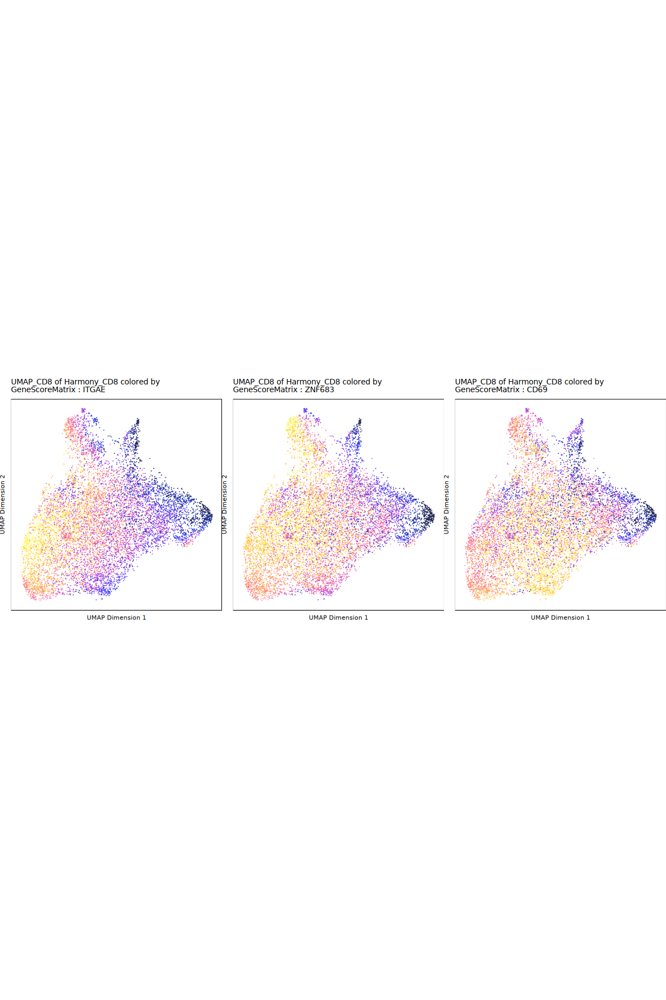

In [18]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD8",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8719419038cd5-Date-2025-03-21_Time-09-39-15.701419.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-21 09:39:15.944164 : 



Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8719419038cd5-Date-2025-03-21_Time-09-39-15.701419.log



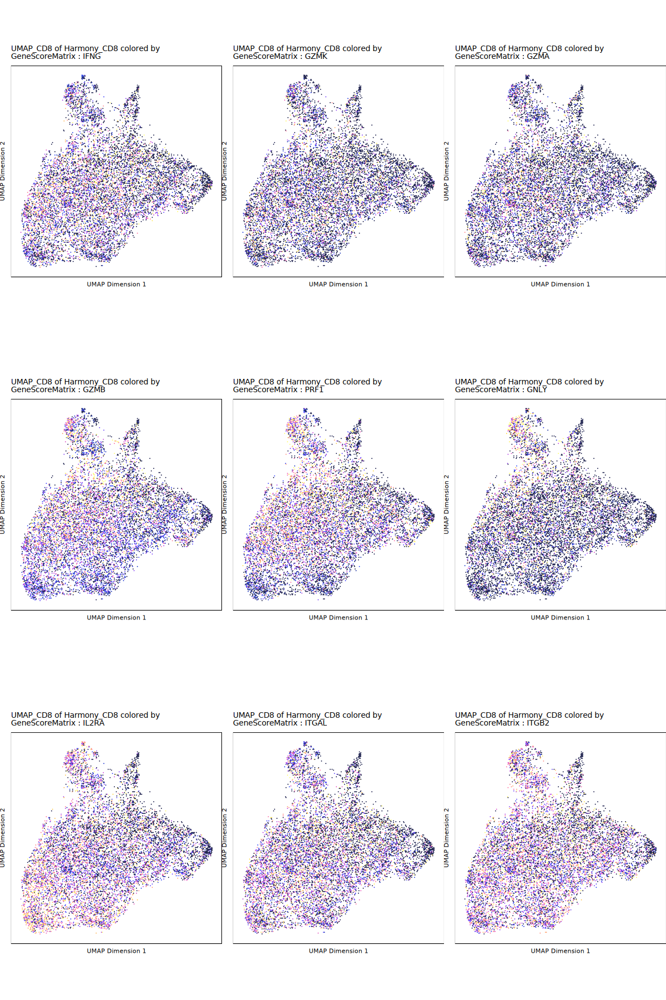

In [19]:
# Teff
markerGenes <- c(
  "IFNG", "GZMK", "GZMA", "GZMB", "PRF1", "GNLY", "IL2RA", "ITGAL", "ITGB2"
)

# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD8",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-87194624330bd-Date-2025-03-21_Time-09-39-34.039243.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-21 09:39:34.300141 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-87194624330bd-Date-2025-03-21_Time-09-39-34.039243.log



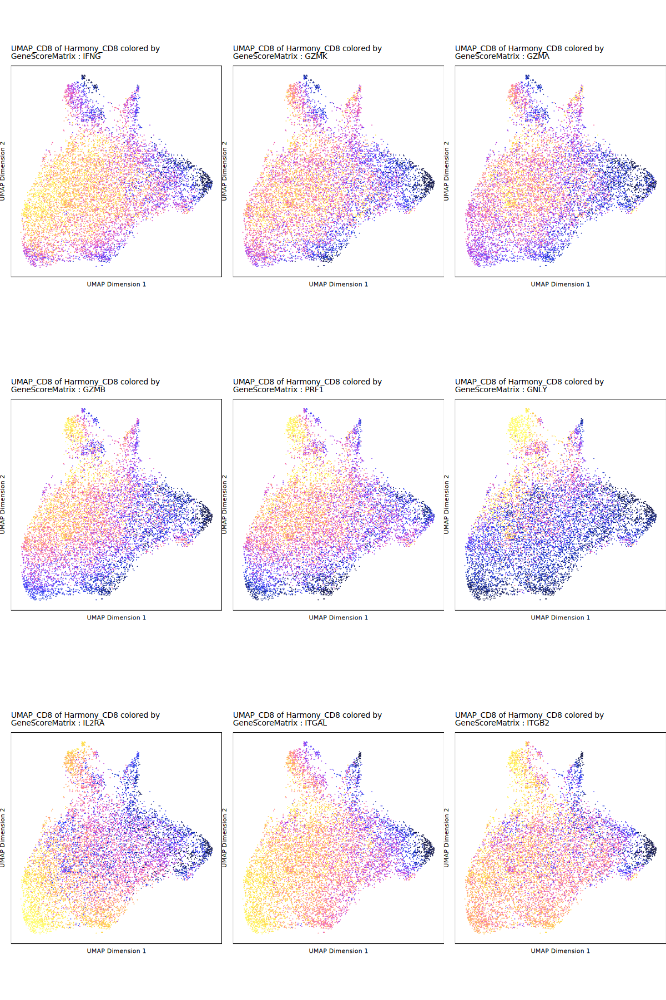

In [20]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD8",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-87194373bf607-Date-2025-03-21_Time-09-39-57.928945.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-21 09:39:58.176438 : 





Plotting Embedding

1 
2 
3 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-87194373bf607-Date-2025-03-21_Time-09-39-57.928945.log



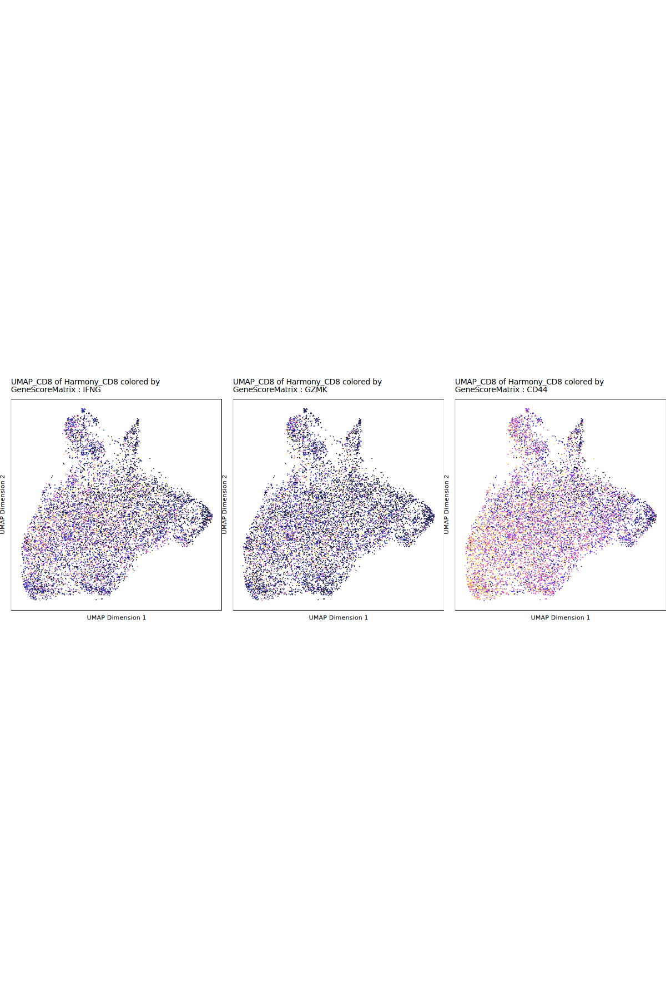

In [21]:
# Tem
markerGenes <- c(
 "IFNG", "GZMK", "CD44"
)

# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD8",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8719465703ad-Date-2025-03-21_Time-09-40-05.844383.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-21 09:40:06.101648 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8719465703ad-Date-2025-03-21_Time-09-40-05.844383.log



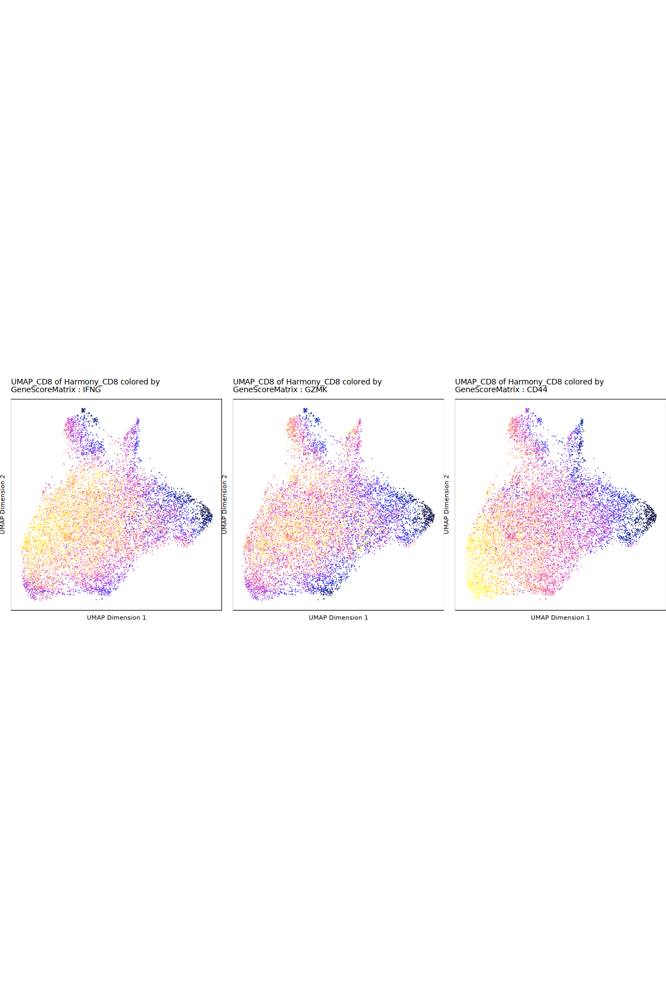

In [22]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD8",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8719474f92d61-Date-2025-03-21_Time-09-40-55.37027.log
If there is an issue, please report to github with logFile!



Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-21 09:40:55.627972 : 



Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8719474f92d61-Date-2025-03-21_Time-09-40-55.37027.log



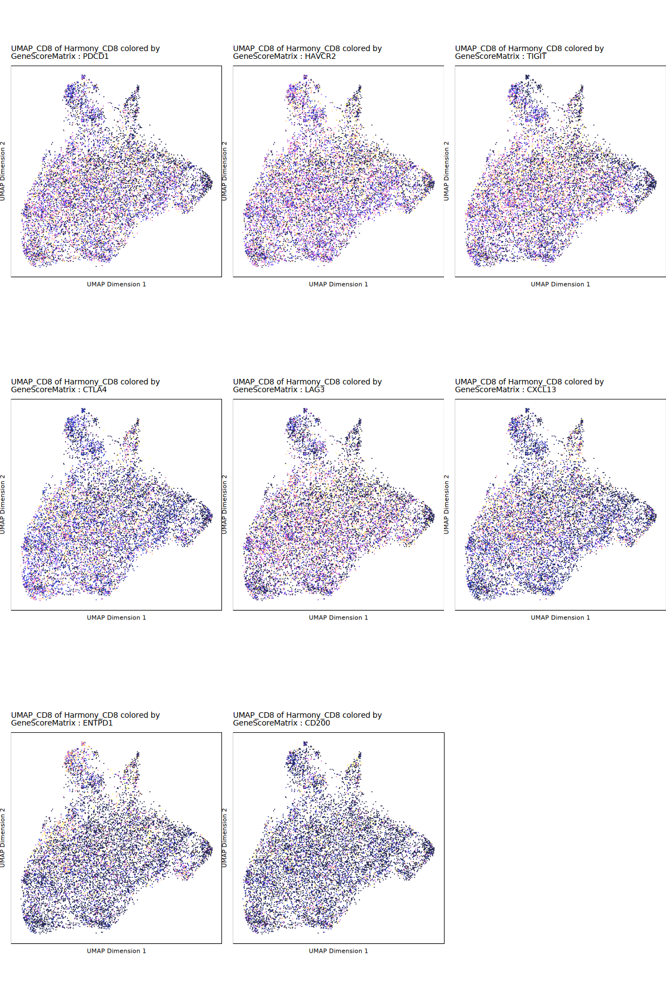

In [24]:
# Tex
markerGenes <- c(
  "PDCD1", "HAVCR2", "TIGIT", "CTLA4", "LAG3", "CXCL13", "ENTPD1", "CD200"
)
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD8",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-87194b858fc3-Date-2025-03-21_Time-09-41-08.90684.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix



Getting Matrix Values...

2025-03-21 09:41:09.218024 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-87194b858fc3-Date-2025-03-21_Time-09-41-08.90684.log



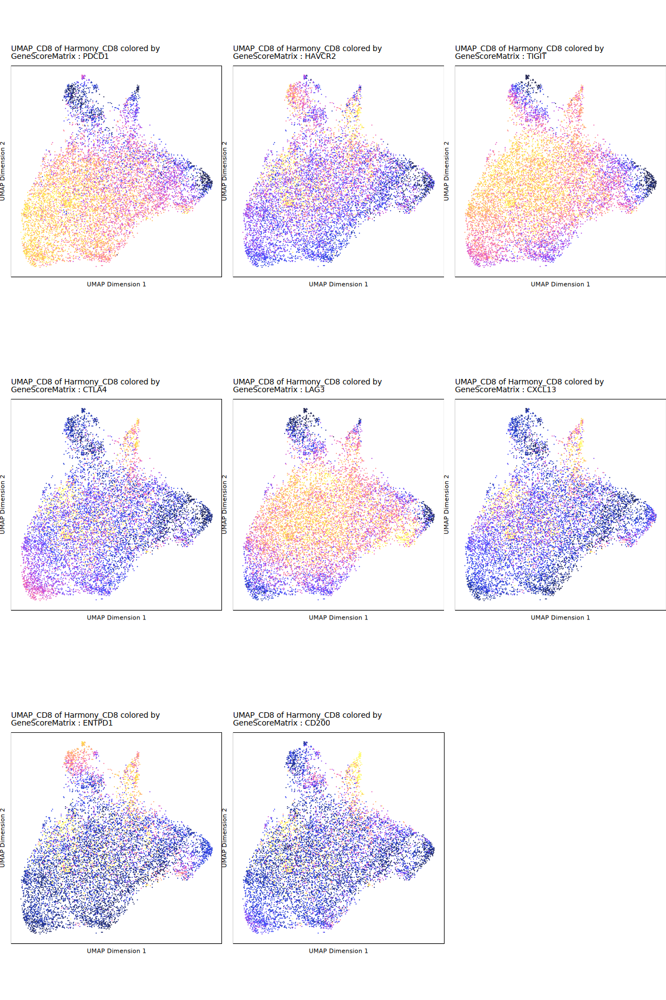

In [25]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD8",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-871943502e7c5-Date-2025-03-21_Time-09-41-30.141339.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix



Getting Matrix Values...

2025-03-21 09:41:30.392959 : 



Plotting Embedding

1 
2 
3 
4 
5 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-871943502e7c5-Date-2025-03-21_Time-09-41-30.141339.log



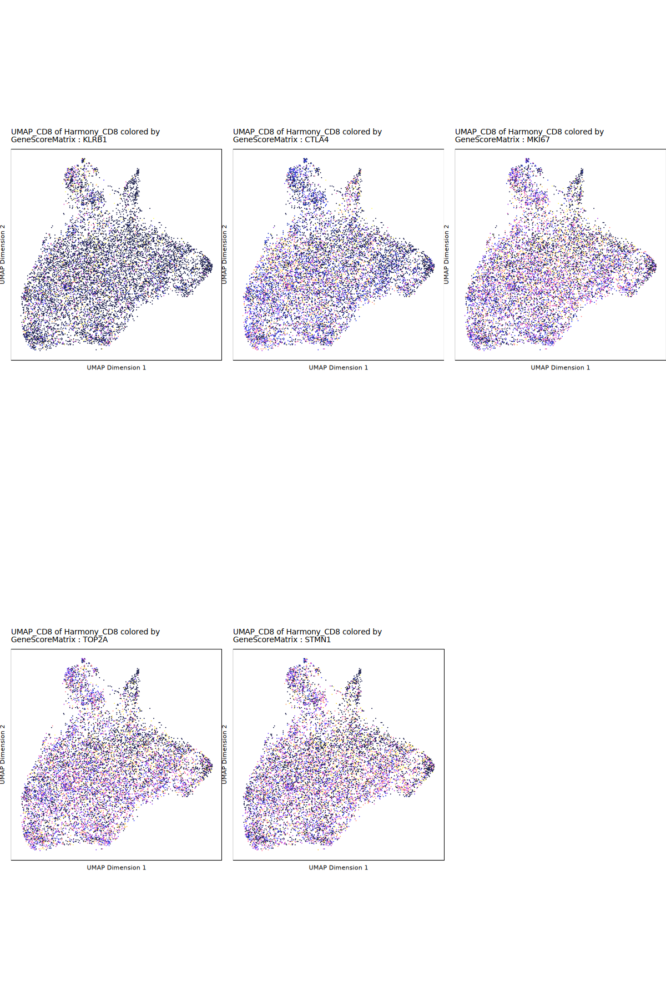

In [26]:
# 增殖相关
markerGenes <- c(
  "KLRB1", "CTLA4", 
  "MKI67", "TOP2A", "STMN1"
)

# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD8",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-87194aa805ec-Date-2025-03-21_Time-09-41-43.819367.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-03-21 09:41:44.072621 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 
5 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-87194aa805ec-Date-2025-03-21_Time-09-41-43.819367.log



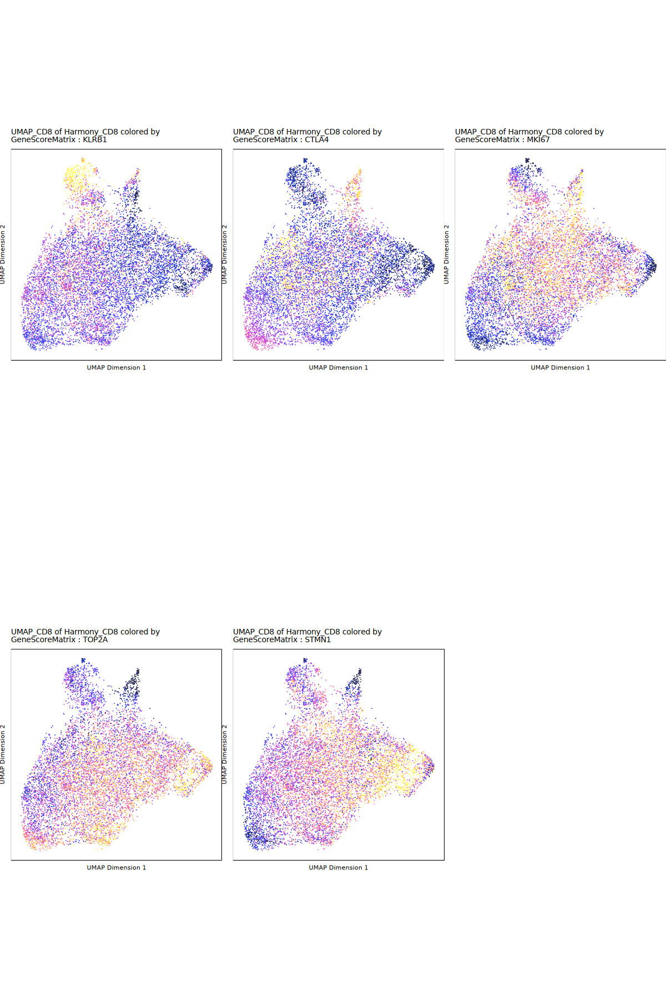

In [27]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD8",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

In [28]:
cell_annotations <- list(
    "Trm" = paste0("C", c(4, 7)),
    "Teff" = paste0("C", c(3, 5, 6, 8:11, 13:14)),
    "NKT" = paste0("C", c(2)),
    "NK" = paste0("C", c(1, 12)),
    "Tprol" = paste0("C", c(15:17))
)

In [29]:
## 根据cell——annotations和proj$Clusters创建proj$cellType列
# 对于cell_annotations中的每一个元素（细胞类型）返回proj$Clusters中对应的索引
idz <- lapply(cell_annotations, function(x) which(proj$clusters_CD8 %in% x))
# 创建proj$cellType列，长度为proj@cellColData的行数，初始化为NA
proj$CD8Type <- rep(NA, nrow(proj@cellColData))
# 遍历idz中的每一个元素，将proj$cellType中对应的索引赋值为元素的名称
for(i in names(idz)){proj$CD8Type[idz[[i]]] <- i}

In [30]:
table(proj$CD8Type)


   NK   NKT  Teff Tprol   Trm 
  715   509  6169  1424  1659 

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-871947d5c6a40-Date-2025-03-21_Time-09-42-04.319026.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-871947d5c6a40-Date-2025-03-21_Time-09-42-04.319026.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-87194a928f4a-Date-2025-03-21_Time-09-42-04.732914.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-87194a928f4a-Date-2025-03-21_Time-09-42-04.732914.log



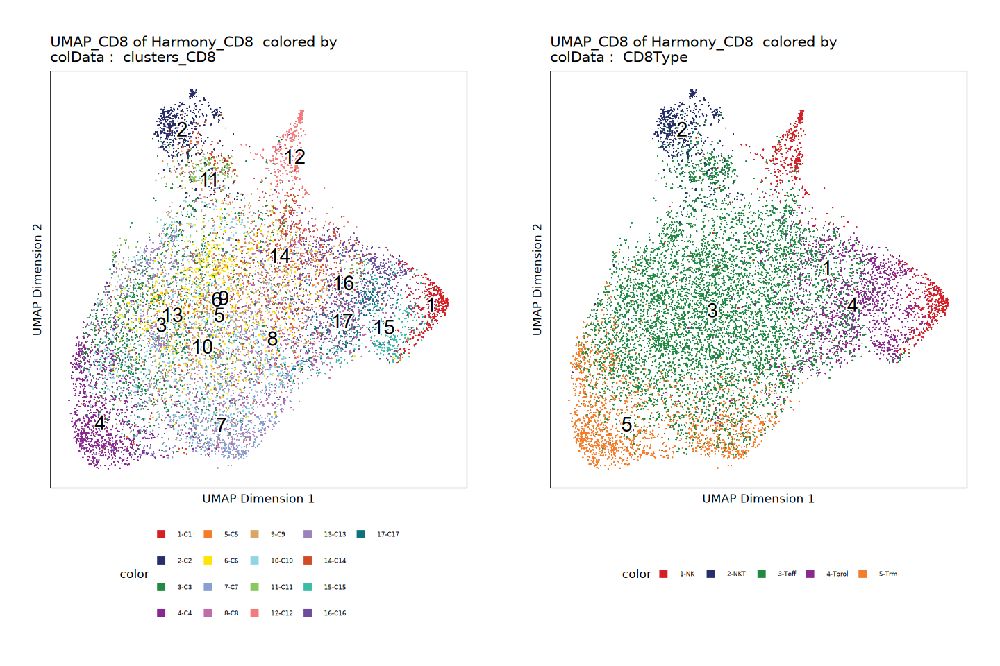

In [31]:
options(repr.plot.height = 8, repr.plot.width = 12)
p1 <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "cellColData", 
    name = "clusters_CD8", 
    embedding = "UMAP_CD8",
    labelSize = 6
    )
p2 <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "cellColData", 
    name = "CD8Type", 
    embedding = "UMAP_CD8",
    labelSize = 6
    )
ggAlignPlots(p1, p2, type = "h")

In [32]:
## marker gene analysis
markersGS <- getMarkerFeatures(
    ArchRProj = proj,
    useMatrix = "GeneScoreMatrix",
    groupBy = "clusters_CD8",
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon"
    )

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-871943d155f2e-Date-2025-03-21_Time-09-42-09.847812.log
If there is an issue, please report to github with logFile!



MatrixClass = Sparse.Double.Matrix

2025-03-21 09:42:10.160574 : Matching Known Biases, 0.004 mins elapsed.

###########
2025-03-21 09:44:28.610067 : Completed Pairwise Tests, 2.312 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-871943d155f2e-Date-2025-03-21_Time-09-42-09.847812.log



In [33]:
saveRDS(markersGS, file = "./ArchRProject_CD8/markersGS_CD8Cluster.rds")

In [34]:
markerList <- getMarkers(markersGS, cutOff = "FDR <= 0.05 & Log2FC >= 1.25")
markerList <- lapply(markerList, as.data.frame)
library(writexl)
## 按照MeanDiff排序
for(i in 1:length(markerList)){
    markerList[[i]] <- markerList[[i]][order(-markerList[[i]]$MeanDiff), ]
}
## 保存为Excel文件
WriteXLS::WriteXLS(markerList,
                   ExcelFileName = "./ArchRProject_CD8/markersGS_CD8Cluster.xlsx",
                   SheetNames = names(markerList))

In [35]:
markerList <- getMarkers(markersGS, cutOff = "FDR <= 0.05 & Log2FC >= 1.25")
## Clusters差异基因，按照FDR排序，并保存为Excel文件
markerList <- lapply(markerList, as.data.frame)
for(i in 1:length(markerList)){
    markerList[[i]] <- markerList[[i]][order(markerList[[i]]$FDR), ]
}
WriteXLS::WriteXLS(markerList,
                   ExcelFileName = "./ArchRProject_CD8/markersGS_FDR_CD8Cluster.xlsx",
                   SheetNames = names(markerList))

In [36]:
## majorType 差异peaks
markerPK <- getMarkerFeatures(
    ArchRProj = proj,
    useMatrix = "PeakMatrix", 
    groupBy = "clusters_CD8",
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon"
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-871946772e63f-Date-2025-03-21_Time-09-44-44.749017.log
If there is an issue, please report to github with logFile!



MatrixClass = Sparse.Integer.Matrix

2025-03-21 09:44:45.293126 : Matching Known Biases, 0.008 mins elapsed.

###########
2025-03-21 09:46:40.86859 : Completed Pairwise Tests, 1.934 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-871946772e63f-Date-2025-03-21_Time-09-44-44.749017.log



In [37]:
saveRDS(markerPK, file = "./ArchRProject_CD8/markersPK_CD8Cluster.rds")

ArchR logging to : ArchRLogs/ArchR-plotMarkerHeatmap-871944b11a0b8-Date-2025-03-21_Time-09-47-05.075698.log
If there is an issue, please report to github with logFile!



Printing Top Marker Genes:

C1:

	LINC01777, AJAP1, ICMT, LINC00337, DISP3, PRAMEF1, ACTL8, KLHDC7A, RNF186, CELA3B, EPHA8, C1QB, MIR4684, HMGB4, C1orf94

C2:

	FAM87B, MIR429, LDLRAD2, FCN3, NFIA-AS2, INSL5, LOC100129046, LOC105378933, ZNF697, S100A1, PKLR, BGLAP, OR10T2, FCER1G, MIR4654

C3:

	KLK12, FAM87B, MIR200A, MIR429, LINC01777, AJAP1, ICMT, LINC00337, DISP3, PRAMEF1, HNRNPCL1, PRAMEF18, PRAMEF14, PRAMEF20, ACTL8

C4:

	MIR3159, MIR6750, SNORA1, SNORA8, SNORD5, SNORA18, MIR1304, C3AR1, TNP2, CEACAM6, KCNN4, LONRF2, IL1RL2, DPP4, CCL20

C5:

	FAM229A, LINC01358, CD160, S100A14, FCGR3B, SELP, DNM3OS, MIR199A2, ATP6V1G3, MIR6078, LOC101927964, FAM170B-AS1, FAM170B, ARMS2, LGALS12

C6:

	PTH, MS4A5, MS4A1, CLEC6A, NPIPB6, CLEC4G, MIR3923, FAM87B, MIR200A, MIR429, LINC01777, AJAP1, ICMT, LINC00337, DISP3

C7:

	FLG2, UTF1, IFITM5, OR56A5, C2CD4B, HBZ, DIPK1C, ELANE, MIR4324, ADAM23, GSC2, HAND2-AS1, SIMC1, KAAG1, ZBED9

C8:

	MEDAG, MIRLET7A3, LOC401357, LINC00320, FAM87B, MIR200A,

 [1] "CCR7"   "IL7R"   "TCF7"   "SELL"   "LEF1"   "KLF2"   "ITGAE"  "ZNF683"
 [9] "CD69"   "IFNG"   "GZMK"   "GZMA"   "GZMB"   "PRF1"   "GNLY"   "IL2RA" 
[17] "ITGAL"  "ITGB2"  "CD45RO" "CD44"   "PDCD1"  "HAVCR2" "TIGIT"  "CTLA4" 
[25] "LLAG3"  "CXCL13" "ENTPD1" "CD200"  "MKI67"  "KLRB1" 


Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotMarkerHeatmap-871944b11a0b8-Date-2025-03-21_Time-09-47-05.075698.log



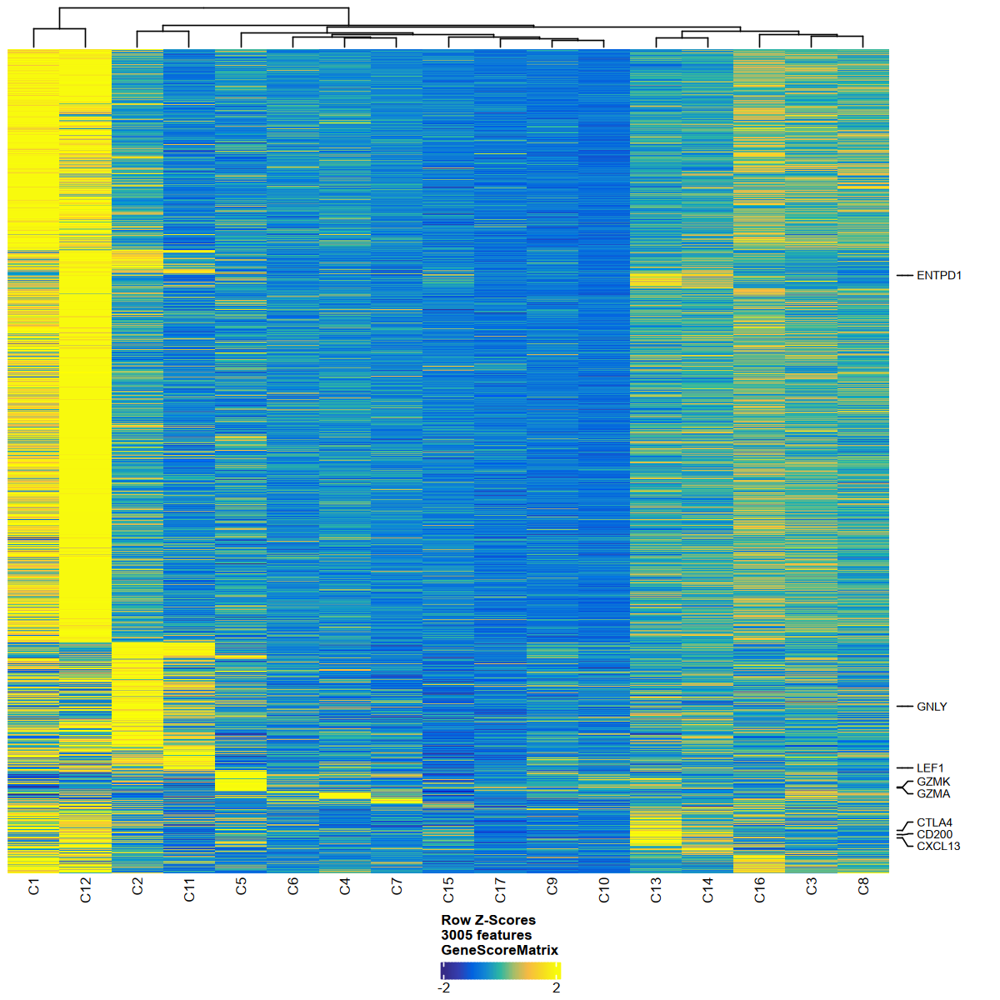

In [38]:
markerGenes <- c(
    "CCR7", "IL7R", "TCF7", "SELL", "LEF1", "KLF2",  # 幼稚T细胞（Tn)&中心记忆T细胞（Tcm)
    "ITGAE", "ZNF683", "CD69", # 组织驻留T细胞(Trm)
    "IFNG", "GZMK", "GZMA", "GZMB", "PRF1", "GNLY", "IL2RA", "ITGAL", "ITGB2", #效应T细胞（Teff）
    "CD45RO", "CD44", # 效应记忆T细胞（Tem）
    "PDCD1", "HAVCR2", "TIGIT", "CTLA4", "LLAG3", "CXCL13", "ENTPD1", "CD200", # 耗竭T细胞
    "MKI67", "KLRB1"
    
)


heatmapGS <- plotMarkerHeatmap(
  seMarker = markersGS, 
  cutOff = "FDR <= 0.05 & Log2FC >= 1.25", 
  labelMarkers = markerGenes
)

options(repr.plot.height = 10, repr.plot.width = 10)
ComplexHeatmap::draw(heatmapGS, 
                     heatmap_legend_side = "bot", 
                     annotation_legend_side = "bot")

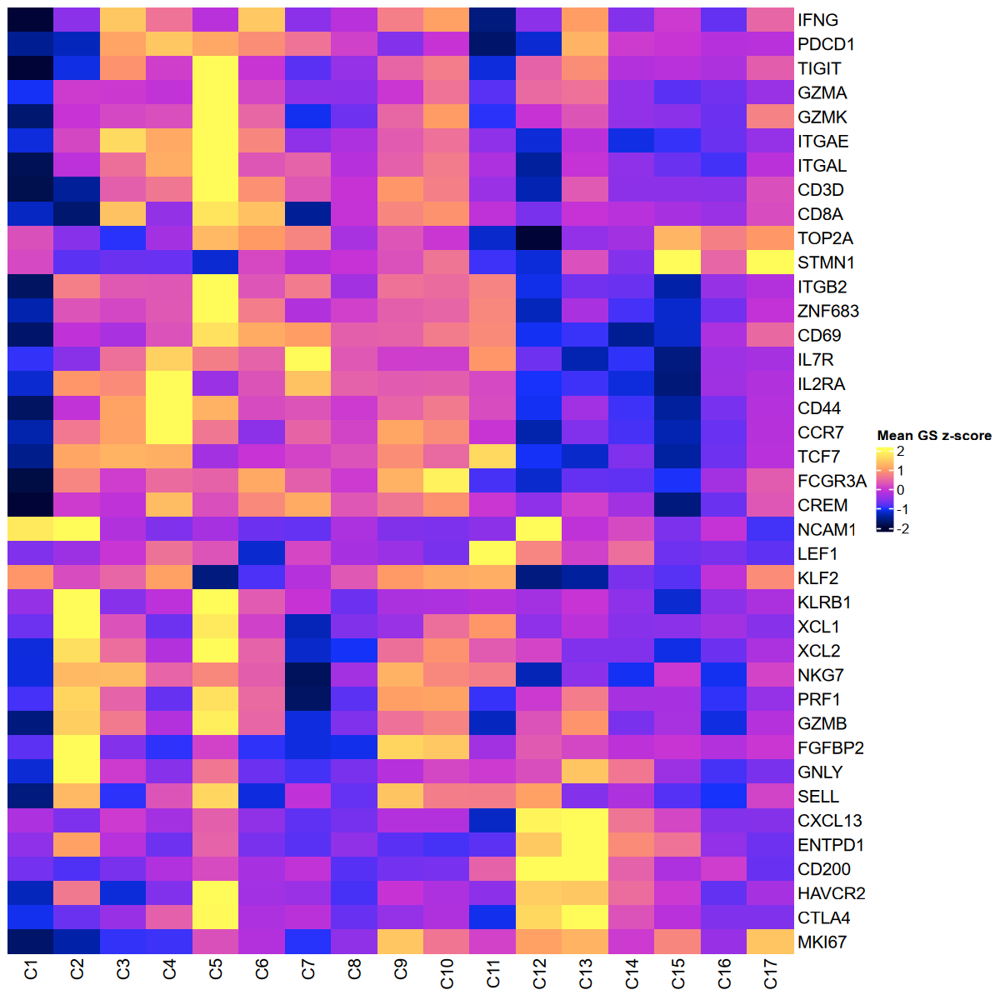

In [39]:
## 后续图 - 基于clusters
### marker gene基因活性
# Heatmap
## marker genes, 根据05_01_annotation中的显著表达来确定绘图的marker genes
markerGenes <- c(
    "CCR7", "IL7R", "TCF7", "SELL", "LEF1", "KLF2",  # 幼稚T细胞（Tn)&中心记忆T细胞（Tcm)
    "ITGAE", "ZNF683", "CD69", # 组织驻留T细胞(Trm)
    "IFNG", "GZMK", "GZMA", "GZMB", "PRF1", "GNLY", "IL2RA", "ITGAL", "ITGB2", #效应T细胞（Teff）
    "CD45RO", "CD44", # 效应记忆T细胞（Tem）
    "PDCD1", "HAVCR2", "TIGIT", "CTLA4", "LLAG3", "CXCL13", "ENTPD1", "CD200", # 耗竭T细胞
    "MKI67", "KLRB1", "TOP2A", "STMN1", # 增殖相关
    "NCAM1", "XCL1", "XCL2", "NKG7", "CREM", "FCGR3A",  # NK
    "FGFBP2", "CD3D", "CD8A"
)

## 绘制只有marker基因的热图，Mean GS z-score

### 提取差异基因中在marker genes中的基因
idx <- which(mcols(markersGS)$name %in% markerGenes)
### 提取指定行，为矩阵
mtx <- assays(markersGS[idx,])$Mean %>% `rownames<-`(., mcols(markersGS)$name[idx])
### 标准化（z-score），并转置
mtx <- t(scale(t(mtx)))
### 定义层次聚类函数de
fh <- function(x) hclust(dist(x), method="ward.D2")
### 定义颜色函数
col_fun1 <- colorRamp2(c(-2,-1,0,1,2), paletteContinuous(set = "horizonExtra", n = 5))
options(repr.plot.width = 10, repr.plot.height = 10)
ht1 <- Heatmap(mtx, name = "Mean GS z-score", cluster_rows = fh, cluster_columns = F, show_row_dend = F, col = col_fun1)
p3 <- draw(ht1)
p3

In [40]:
mtx

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,C15,C16,C17
STMN1,0.1813414,-0.807719560,-0.72830428,-0.73813861,-1.1877064,0.176279190,-0.153503440,-0.013021403,0.250858666,0.6095832877,-0.91973088,-1.157417737,0.240038413,-0.57612942,2.25097578,0.45311858,2.11947643
ZNF683,-1.3652708,0.279901868,0.16592678,0.31417625,2.8065753,0.692663676,-0.207141113,0.103645117,0.385192637,0.4427298272,0.80669411,-1.305812109,-0.272297998,-0.89672748,-1.21445893,-0.68174205,-0.05405507
FCGR3A,-1.9156466,0.777101110,0.07875628,0.51943320,0.4193719,1.157607435,0.383621333,0.055150165,1.232710759,1.8993608710,-0.88522861,-1.208339267,-0.762785996,-0.77796451,-0.99249228,-0.33753353,0.35687772
XCL2,-1.1494881,1.695436680,0.53298585,-0.19030042,2.2307511,0.420917254,-1.229526039,-1.009921236,0.548479356,0.9218760432,0.35118774,0.142931986,-0.589497149,-0.59517198,-1.10200705,-0.72310163,-0.25555243
XCL1,-0.7163352,2.629537839,0.25754346,-0.71584725,1.8070650,0.112887692,-1.316749679,-0.583293877,-0.413168388,0.5423808314,0.96455685,-0.496084168,-0.115078422,-0.54427045,-0.52440453,-0.34292384,-0.54581589
SELL,-1.6086587,1.298019481,-0.96472740,0.28142908,1.6100398,-1.137914392,-0.072437126,-0.757705662,1.419507424,0.7041660148,0.68636092,1.073220956,-0.575674943,-0.24182082,-0.84133783,-1.00145281,0.12898598
IL2RA,-1.1993186,0.969802994,0.84616604,2.06192065,-0.4030256,0.269844680,1.401803356,0.413949387,0.347923089,0.3748459631,0.17743640,-0.996362903,-0.915441921,-1.14660726,-1.63404658,-0.36027361,-0.20861608
CREM,-2.6669119,0.063866174,-0.07587225,1.35551532,0.2360202,0.825159986,1.172468836,0.306445894,0.616827235,0.9156758007,0.02974799,-0.502394146,0.099310460,-0.34178834,-1.61416067,-0.73079837,0.31088774
PRF1,-0.8959859,1.599661604,0.42030303,-0.75024873,1.7232741,0.500068045,-1.743322980,-0.807808433,1.053602358,1.0995390015,-0.94019436,0.048974910,0.698947160,-0.30517067,-0.30136526,-0.95410957,-0.44616430
ENTPD1,-0.5017323,1.073378892,-0.13183205,-0.70456325,0.4213861,-0.637153662,-0.820120935,-0.481448566,-0.814945578,-0.8923824489,-0.80524898,1.477727257,2.553662391,0.84636010,0.59067812,-0.47167668,-0.70208848


In [46]:
new_order <- c(
      "Trm" , "Teff" , "NKT" , "NK" , "Tprol" 
)

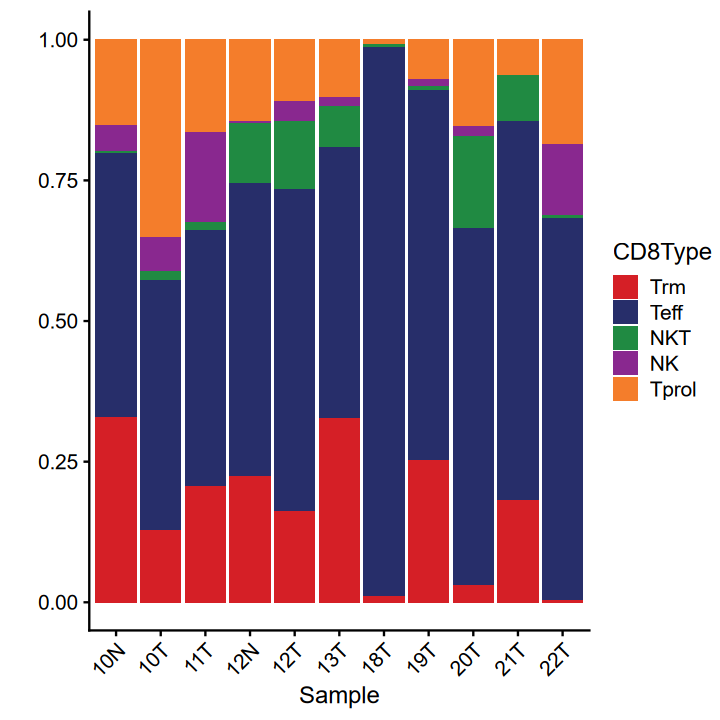

In [47]:
# 计算各样本中细胞类型的比例
sample_cell_type_distribution <- table(proj$Sample, proj$CD8Type)
sample_cell_type_distribution <- prop.table(sample_cell_type_distribution, 1)

# 转换为数据框
df_sample <- as.data.frame(sample_cell_type_distribution)
df_sample$Var2 <- factor(df_sample$Var2, levels = new_order)
cols <- ArchR::paletteDiscrete(df_sample$Var2)

# 创建堆叠图
p <- ggplot(df_sample, aes(x = Var1, y = Freq, fill = Var2)) +
  geom_bar(stat="identity", position = position_stack(reverse = TRUE)) +
  scale_fill_manual(values = cols) +
  theme_cowplot() +
  xlab("Sample") +
  ylab("") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  labs(fill = "CD8Type")

options(repr.plot.width = 6, repr.plot.height = 6)
# ggsave("/data/hanxue/BCY_ATAC/joint_output/Sample-CellType-Distribution.svg",plot = p, width = 6, height = 6, device = "svg")
p

In [9]:
# 获取并转换细胞元数据
cell_stats <- getCellColData(proj) %>%
  as.data.frame() %>%
  group_by(Sample, CD8Type) %>% 
  summarise(Count = n()) %>%
  tidyr::pivot_wider(names_from = CD8Type, values_from = Count, values_fill = 0) %>%
  mutate(Total = rowSums(across(where(is.numeric))))  # 计算所有数值列的总和
# 查看结果
cell_stats

`summarise()` has grouped output by 'Sample'. You can override using the
`.groups` argument.


Sample,NK,NKT,Teff,Tprol,Trm,Total
<chr>,<int>,<int>,<int>,<int>,<int>,<dbl>
10N,63,5,633,204,442,1347
10T,4,1,28,22,8,63
11T,303,26,846,304,385,1864
12N,1,20,98,27,42,188
12T,15,47,225,42,63,392
13T,15,61,407,86,277,846
18T,0,2,296,2,3,303
19T,9,5,431,45,165,655
20T,26,230,891,215,41,1403


In [10]:
# 保存
saveArchRProject(ArchRProj = proj, 
                 load = FALSE)
sessionInfo()

Saving ArchRProject...



R version 4.4.1 (2024-06-14)
Platform: x86_64-conda-linux-gnu
Running under: Ubuntu 22.04.2 LTS

Matrix products: default
BLAS/LAPACK: /home/hanxue/miniconda3/envs/scseq/lib/libopenblasp-r0.3.21.so;  LAPACK version 3.9.0

Random number generation:
 RNG:     L'Ecuyer-CMRG 
 Normal:  Inversion 
 Sample:  Rejection 
 
locale:
 [1] LC_CTYPE=C.UTF-8       LC_NUMERIC=C           LC_TIME=C.UTF-8       
 [4] LC_COLLATE=C.UTF-8     LC_MONETARY=C.UTF-8    LC_MESSAGES=C.UTF-8   
 [7] LC_PAPER=C.UTF-8       LC_NAME=C              LC_ADDRESS=C          
[10] LC_TELEPHONE=C         LC_MEASUREMENT=C.UTF-8 LC_IDENTIFICATION=C   

time zone: Etc/UTC
tzcode source: system (glibc)

attached base packages:
[1] stats4    grid      stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] chromVARmotifs_0.2.0              ggrepel_0.9.6                    
 [3] cowplot_1.1.3                     dplyr_1.1.4                      
 [5] BSgenome.Hsapiens.UCSC.hg38_1